In [94]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import anderson
from sklearn.preprocessing import MultiLabelBinarizer
from ydata_profiling import ProfileReport
%matplotlib inline

In [95]:
datos = pd.read_csv('baseball.csv')
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,field_type,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,other_info_string,start_time,venue
0,"40,030']",New York Mets,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,"Sunday, April 3, 2016",NaN,: 3:13,"Night Game, on grass",Kansas City Royals,0,9,4,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:38 p.m. Local,: Kauffman Stadium
1,"21,621']",Philadelphia Phillies,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,"Wednesday, April 6, 2016",NaN,: 2:23,"Night Game, on grass",Cincinnati Reds,0,8,3,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:11 p.m. Local,: Great American Ball Park
2,"12,622']",Minnesota Twins,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,"Wednesday, April 6, 2016",NaN,: 3:11,"Night Game, on grass",Baltimore Orioles,0,9,4,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:07 p.m. Local,: Oriole Park at Camden Yards
3,"18,531']",Washington Nationals,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,"Wednesday, April 6, 2016",NaN,: 2:53,"Night Game, on grass",Atlanta Braves,1,8,1,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:10 p.m. Local,: Turner Field
4,"18,572']",Colorado Rockies,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,"Wednesday, April 6, 2016",NaN,: 2:39,"Day Game, on grass",Arizona Diamondbacks,0,8,3,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 12:40 p.m. Local,: Chase Field


# Exploración de datos

In [96]:
profile = ProfileReport(datos)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [97]:
datos.describe()

,away_team_errors,away_team_hits,away_team_runs,field_type,home_team_errors,home_team_hits,home_team_runs
count,2463.000000,2463.000000,2463.000000,0.0,2463.000000,2463.000000,2463.000000
mean,0.580593,8.764515,4.413723,NaN,0.585871,8.611855,4.519691
std,0.793391,3.511581,3.104556,NaN,0.805542,3.436965,3.111572
min,0.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000
25%,0.000000,6.000000,2.000000,NaN,0.000000,6.000000,2.000000
50%,0.000000,8.000000,4.000000,NaN,0.000000,8.000000,4.000000
75%,1.000000,11.000000,6.000000,NaN,1.000000,11.000000,6.000000
max,5.000000,22.000000,21.000000,NaN,5.000000,22.000000,17.000000


In [98]:
datos.dtypes

attendance            object
away_team             object
away_team_errors       int64
away_team_hits         int64
away_team_runs         int64
boxscore_url          object
date                  object
field_type           float64
game_duration         object
game_type             object
home_team             object
home_team_errors       int64
home_team_hits         int64
home_team_runs         int64
other_info_string     object
start_time            object
venue                 object
dtype: object

In [99]:
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,field_type,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,other_info_string,start_time,venue
0,"40,030']",New York Mets,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,"Sunday, April 3, 2016",NaN,: 3:13,"Night Game, on grass",Kansas City Royals,0,9,4,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:38 p.m. Local,: Kauffman Stadium
1,"21,621']",Philadelphia Phillies,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,"Wednesday, April 6, 2016",NaN,: 2:23,"Night Game, on grass",Cincinnati Reds,0,8,3,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:11 p.m. Local,: Great American Ball Park
2,"12,622']",Minnesota Twins,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,"Wednesday, April 6, 2016",NaN,: 3:11,"Night Game, on grass",Baltimore Orioles,0,9,4,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:07 p.m. Local,: Oriole Park at Camden Yards
3,"18,531']",Washington Nationals,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,"Wednesday, April 6, 2016",NaN,: 2:53,"Night Game, on grass",Atlanta Braves,1,8,1,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 7:10 p.m. Local,: Turner Field
4,"18,572']",Colorado Rockies,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,"Wednesday, April 6, 2016",NaN,: 2:39,"Day Game, on grass",Arizona Diamondbacks,0,8,3,"<!-- \n <div class=""section_content"" id=""d...",Start Time: 12:40 p.m. Local,: Chase Field


Se identificaron 17 variables en el conjunto de datos, de las cuales 4 muestran una alta proporción de ceros. Estas variables están relacionadas con las carreras anotadas y los errores de los equipos (local y visitante). Es importante destacar que la presencia de numerosos ceros no se considera un error, ya que es inherente a la naturaleza de estas variables.

Adicionalmente, se observó que las columnas "field_type" y "other_info_string" no aportan información útil. La primera contiene únicamente datos nulos, mientras que la segunda presenta información en formato HTML que no sigue una estructura analizable. En consecuencia, se tomó la decisión de excluir estas columnas del conjunto de datos final.

En cuanto a la integridad del conjunto de datos, se encontraron 2466 celdas vacías, lo que representa aproximadamente el 5.9% del total. No se identificaron datos duplicados en el conjunto.

Estas acciones permiten mejorar la calidad y relevancia del conjunto de datos al eliminar variables irrelevantes y comprender la naturaleza de las celdas vacías, contribuyendo así a un análisis más preciso y significativo.

También se encontró que que la columna attendance posee caracteres inválidos al final, así mismo game_duration posee un : al inicio inválido.

Se cuenta con datos de tipo string e int, sin embargo hay columnas que no poseen los mejores tipos de datos para ser trabajados, es por esto que deberán ser analizadas para determinar el mejor tipo de dato.

# 1.1 Exploración

# Limpieza

In [100]:
datos = datos.drop(["field_type", "other_info_string"], axis=1)
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,start_time,venue
0,"40,030']",New York Mets,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,"Sunday, April 3, 2016",: 3:13,"Night Game, on grass",Kansas City Royals,0,9,4,Start Time: 7:38 p.m. Local,: Kauffman Stadium
1,"21,621']",Philadelphia Phillies,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,"Wednesday, April 6, 2016",: 2:23,"Night Game, on grass",Cincinnati Reds,0,8,3,Start Time: 7:11 p.m. Local,: Great American Ball Park
2,"12,622']",Minnesota Twins,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,"Wednesday, April 6, 2016",: 3:11,"Night Game, on grass",Baltimore Orioles,0,9,4,Start Time: 7:07 p.m. Local,: Oriole Park at Camden Yards
3,"18,531']",Washington Nationals,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,"Wednesday, April 6, 2016",: 2:53,"Night Game, on grass",Atlanta Braves,1,8,1,Start Time: 7:10 p.m. Local,: Turner Field
4,"18,572']",Colorado Rockies,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,"Wednesday, April 6, 2016",: 2:39,"Day Game, on grass",Arizona Diamondbacks,0,8,3,Start Time: 12:40 p.m. Local,: Chase Field


In [101]:
datos["attendance"] = datos["attendance"].str.replace("']", "")
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,start_time,venue
0,"40,030",New York Mets,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,"Sunday, April 3, 2016",: 3:13,"Night Game, on grass",Kansas City Royals,0,9,4,Start Time: 7:38 p.m. Local,: Kauffman Stadium
1,"21,621",Philadelphia Phillies,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,"Wednesday, April 6, 2016",: 2:23,"Night Game, on grass",Cincinnati Reds,0,8,3,Start Time: 7:11 p.m. Local,: Great American Ball Park
2,"12,622",Minnesota Twins,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,"Wednesday, April 6, 2016",: 3:11,"Night Game, on grass",Baltimore Orioles,0,9,4,Start Time: 7:07 p.m. Local,: Oriole Park at Camden Yards
3,"18,531",Washington Nationals,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,"Wednesday, April 6, 2016",: 2:53,"Night Game, on grass",Atlanta Braves,1,8,1,Start Time: 7:10 p.m. Local,: Turner Field
4,"18,572",Colorado Rockies,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,"Wednesday, April 6, 2016",: 2:39,"Day Game, on grass",Arizona Diamondbacks,0,8,3,Start Time: 12:40 p.m. Local,: Chase Field


In [102]:
datos["game_duration"] = datos["game_duration"].str.replace(": ", "")
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,start_time,venue
0,"40,030",New York Mets,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,"Sunday, April 3, 2016",3:13,"Night Game, on grass",Kansas City Royals,0,9,4,Start Time: 7:38 p.m. Local,: Kauffman Stadium
1,"21,621",Philadelphia Phillies,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,"Wednesday, April 6, 2016",2:23,"Night Game, on grass",Cincinnati Reds,0,8,3,Start Time: 7:11 p.m. Local,: Great American Ball Park
2,"12,622",Minnesota Twins,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,"Wednesday, April 6, 2016",3:11,"Night Game, on grass",Baltimore Orioles,0,9,4,Start Time: 7:07 p.m. Local,: Oriole Park at Camden Yards
3,"18,531",Washington Nationals,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,"Wednesday, April 6, 2016",2:53,"Night Game, on grass",Atlanta Braves,1,8,1,Start Time: 7:10 p.m. Local,: Turner Field
4,"18,572",Colorado Rockies,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,"Wednesday, April 6, 2016",2:39,"Day Game, on grass",Arizona Diamondbacks,0,8,3,Start Time: 12:40 p.m. Local,: Chase Field


### Corrección de tipos de variables

In [103]:
for i in datos["attendance"]:
  print(i)

40,030
21,621
12,622
18,531
18,572
28,386
12,757
28,329
26,049
10,478
47,820
24,123
36,911
13,468
45,229
13,371
24,318
40,638
43,332
26,271
40,882
21,203
21,226
34,898
19,400
27,938
16,783
14,160
45,432
41,432
21,585
21,078
16,112
12,777
14,706
37,168
21,810
46,268
16,497
24,333
31,453
12,996
41,266
14,832
30,250
17,503
44,954
21,671
20,674
22,735
18,208
41,357
27,217
42,933
37,053
28,755
23,809
24,135
39,077
24,749
28,181
49,271
40,164
34,279
40,087
42,338
41,590
41,028
47,822
21,719
31,559
35,551
17,302
27,567
40,471
28,049
29,862
15,230
14,604
34,579
22,230
34,264
35,291
46,716
33,132
38,712
17,803
37,479
33,148
30,488
27,869
27,257
28,235
36,239
29,396
20,017
28,724
30,304
20,435
24,020
37,354
40,987
43,683
41,280
26,176
11,399
30,861
38,391
23,826
36,162
14,885
38,700
32,480
13,554
45,565
41,363
36,538
21,764
28,213
28,080
11,131
37,422
21,534
15,983
39,512
20,557
19,052
11,345
34,160
45,453
41,448
30,145
19,901
34,971
18,792
22,980
24,678
24,516
20,014
37,696
41,635
15,337
31,625

In [104]:
# Attendace es un numero pero posee comas, por lo que se debe quitar,
# mismo tiene filas que no son numeros por lo que se deben quitar

# ya que es asistencia debe ser un numero entero

datos["attendance"] = datos["attendance"].str.replace(",", "")
datos["attendance"] = pd.to_numeric(datos["attendance"], errors='coerce')
datos = datos.dropna(subset=["attendance"])
datos["attendance"] = datos["attendance"].astype(int)
datos["attendance"]

0       40030
1       21621
2       12622
3       18531
4       18572
        ...  
2458    31042
2459    39500
2460    20098
2461    17883
2462    10298
Name: attendance, Length: 2460, dtype: int32

In [105]:
# game_duration es hora:minutos por lo 
# que se debe convertir a minutos y pasarlo a un entero

datos["game_duration"] = datos["game_duration"].str.split(':').apply(lambda x: int(x[0]) * 60 + int(x[1]))
datos["game_duration"]

0       193
1       143
2       191
3       173
4       159
       ... 
2458    171
2459    182
2460    199
2461    202
2462    209
Name: game_duration, Length: 2460, dtype: int64

In [106]:
for i in datos["start_time"]:
  print(i)

Start Time: 7:38 p.m. Local
Start Time: 7:11 p.m. Local
Start Time: 7:07 p.m. Local
Start Time: 7:10 p.m. Local
Start Time: 12:40 p.m. Local
Start Time: 7:07 p.m. Local
Start Time: 7:10 p.m. Local
Start Time: 7:11 p.m. Local
Start Time: 7:08 p.m. Local
Start Time: 7:08 p.m. Local
Start Time: 1:11 p.m. Local
Start Time: 7:10 p.m. Local
Start Time: 7:37 p.m. Local
Start Time: 7:10 p.m. Local
Start Time: 3:09 p.m. Local
Start Time: 7:07 p.m. Local
Start Time: 7:11 p.m. Local
Start Time: 3:16 p.m. Local
Start Time: 7:12 p.m. Local
Start Time: 1:10 p.m. Local
Start Time: 7:06 p.m. Local
Start Time: 7:11 p.m. Local
Start Time: 1:10 p.m. Local
Start Time: 7:05 p.m. Local
Start Time: 7:05 p.m. Local
Start Time: 7:08 p.m. Local
Start Time: 7:09 p.m. Local
Start Time: 7:10 p.m. Local
Start Time: 7:09 p.m. Local
Start Time: 7:16 p.m. Local
Start Time: 7:07 p.m. Local
Start Time: 7:11 p.m. Local
Start Time: 7:11 p.m. Local
Start Time: 7:10 p.m. Local
Start Time: 7:11 p.m. Local
Start Time: 11:07 a

In [107]:
# start_time posee la palabra "Start Time:" ademas de que todos son locales
# por lo que se debe quitar ambas palabras y dejar solo la hora:minutos
# y convertirlo a un formato de tiempo
datos["start_time"] = datos["start_time"].str.replace("Start Time: ", "")
datos["start_time"] = datos["start_time"].str.replace(" Local", "")
datos["start_time"] = datos["start_time"].str.replace(".", "")
datos["start_time"] = pd.to_datetime(datos["start_time"], format='%I:%M %p').dt.time
datos["start_time"]

0       19:38:00
1       19:11:00
2       19:07:00
3       19:10:00
4       12:40:00
          ...   
2458    16:09:00
2459    13:15:00
2460    12:41:00
2461    16:57:00
2462    18:22:00
Name: start_time, Length: 2460, dtype: object

In [108]:
for i in datos["venue"]:
  print(i)

: Kauffman Stadium
: Great American Ball Park
: Oriole Park at Camden Yards
: Turner Field
: Chase Field
: Globe Life Park in Arlington
: Tropicana Field
: Petco Park
: PNC Park
: Oakland-Alameda County Coliseum
: Yankee Stadium III
: Miller Park
: Marlins Park
: Safeco Field
: Citizens Bank Park
: Oakland-Alameda County Coliseum
: Citi Field
: Target Field
: Minute Maid Park
: Comerica Park
: Wrigley Field
: Minute Maid Park
: Coors Field
: Wrigley Field
: Nationals Park
: Rogers Centre
: Oriole Park at Camden Yards
: Turner Field
: Busch Stadium III
: AT&T Park
: Citizens Bank Park
: Target Field
: Marlins Park
: Great American Ball Park
: U.S. Cellular Field
: Fenway Park
: Tropicana Field
: Busch Stadium III
: Great American Ball Park
: Rogers Centre
: Globe Life Park in Arlington
: Tropicana Field
: AT&T Park
: Safeco Field
: Citi Field
: Target Field
: Dodger Stadium
: Comerica Park
: Coors Field
: Turner Field
: Chase Field
: AT&T Park
: Tropicana Field
: Busch Stadium III
: Saf

In [109]:
# venue posee un ": " al inicio de cada nombre de estadio por lo que se quitra
datos["venue"] = datos["venue"].str.replace(": ", "")
datos["venue"]

0                  Kauffman Stadium
1          Great American Ball Park
2       Oriole Park at Camden Yards
3                      Turner Field
4                       Chase Field
                   ...             
2458                Tropicana Field
2459                       PNC Park
2460                    Miller Park
2461                   Marlins Park
2462              Progressive Field
Name: venue, Length: 2460, dtype: object

# 1.2 Tipo de variables

- Attendance: cuantitativa discreta
- Away team: categórica nominal
- Away team errors: cuantitativa discreta
- Away team hits: cuantitativa discreta
- Away team runs: cuantitativa discreta
- Boxscore url: categórica nominal
- date: categórica ordinal
- field_type : categórica nominal (esta la vamos a quitar)
- Game duration: cuantitativa continua
- game type: categórica nominal
- home team: categórica nominal
- Home team errors: cuantitativa discreta
- Home team hits: cuantitativa discreta
- Home team runs: cuantitativa discreta
- start time: categórica nominal
- venue: categórica nominal

# 1.3 Gráficos

In [110]:
profile = ProfileReport(datos)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

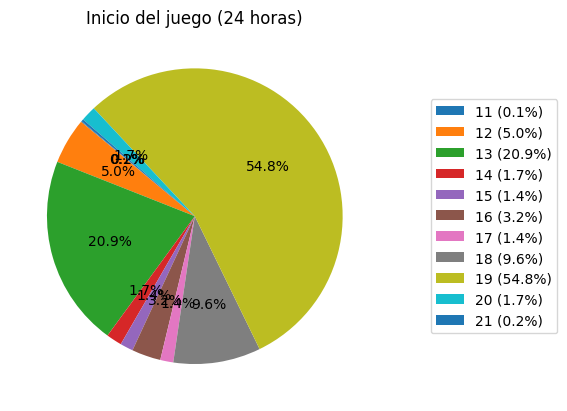

In [111]:
# Start time no es reconocido por profile, por lo que la graficará a mano

horas = [t.hour for t in datos["start_time"]]

conteo_horas = {hora: horas.count(hora) for hora in set(horas)}

total = sum(conteo_horas.values())
porcentajes = {hora: (count / total) * 100 for hora, count in conteo_horas.items()}

patches, texts, autotexts = plt.pie(conteo_horas.values(), labels=None, autopct='%1.1f%%', startangle=140, labeldistance=1.1)

plt.legend([f'{hora} ({porcentaje:.1f}%)' for hora, porcentaje in porcentajes.items()], loc="center right", bbox_to_anchor=(1.5, 0.5))

plt.title('Inicio del juego (24 horas)')

plt.show()

# 1.4 Variables categóricas

# 1.5 Variables numéricas

# 1.6 limpieza según técnicas

## Codificando variables

In [112]:
datos.head()

,attendance,away_team,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,game_duration,game_type,home_team,home_team_errors,home_team_hits,home_team_runs,start_time,venue
0,40030,New York Mets,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,"Sunday, April 3, 2016",193,"Night Game, on grass",Kansas City Royals,0,9,4,19:38:00,Kauffman Stadium
1,21621,Philadelphia Phillies,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,"Wednesday, April 6, 2016",143,"Night Game, on grass",Cincinnati Reds,0,8,3,19:11:00,Great American Ball Park
2,12622,Minnesota Twins,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,"Wednesday, April 6, 2016",191,"Night Game, on grass",Baltimore Orioles,0,9,4,19:07:00,Oriole Park at Camden Yards
3,18531,Washington Nationals,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,"Wednesday, April 6, 2016",173,"Night Game, on grass",Atlanta Braves,1,8,1,19:10:00,Turner Field
4,18572,Colorado Rockies,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,"Wednesday, April 6, 2016",159,"Day Game, on grass",Arizona Diamondbacks,0,8,3,12:40:00,Chase Field


In [113]:
def codif_y_ligar(dataframe_original, variables_a_codificar):
    dummies = pd.get_dummies(dataframe_original[[variables_a_codificar]])
    resultado = pd.concat([dataframe_original, dummies], axis = 1)
    resultado = resultado.drop([variables_a_codificar], axis = 1)
    return(resultado) 

In [114]:
variables_a_codificar = ['away_team', "game_type", "home_team", "venue"]   #  Esta es una lista de variables
newData = datos
for variable in variables_a_codificar:
    newData = codif_y_ligar(newData, variable)

In [115]:
newData.head()

,attendance,away_team_errors,away_team_hits,away_team_runs,boxscore_url,date,game_duration,home_team_errors,home_team_hits,home_team_runs,...,venue_Petco Park,venue_Progressive Field,venue_Rogers Centre,venue_Safeco Field,venue_Target Field,venue_Tropicana Field,venue_Turner Field,venue_U.S. Cellular Field,venue_Wrigley Field,venue_Yankee Stadium III
0,40030,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,"Sunday, April 3, 2016",193,0,9,4,...,False,False,False,False,False,False,False,False,False,False
1,21621,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,"Wednesday, April 6, 2016",143,0,8,3,...,False,False,False,False,False,False,False,False,False,False
2,12622,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,"Wednesday, April 6, 2016",191,0,9,4,...,False,False,False,False,False,False,False,False,False,False
3,18531,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,"Wednesday, April 6, 2016",173,1,8,1,...,False,False,False,False,False,False,True,False,False,False
4,18572,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,"Wednesday, April 6, 2016",159,0,8,3,...,False,False,False,False,False,False,False,False,False,False


### Conversión de la fecha a dia - fecha

In [116]:
dayName = []
day = []
month = []
year = []

tempDay = []

for date in newData["date"]:
  temp = date.split(",")
  dayName.append(temp[0])
  tempDay.append(temp[1])
  year.append(temp[2])

for date in tempDay:
  temp = date.split(" ")
  day.append(temp[-1])
  month.append(temp[1])

year = [i.replace(" ", "") for i in year]

newData["dayName"] = dayName
newData["day"] = day
newData["month"] = month
newData["year"] = year

newData = newData.drop(["date"], axis=1)

newData.head()


,attendance,away_team_errors,away_team_hits,away_team_runs,boxscore_url,game_duration,home_team_errors,home_team_hits,home_team_runs,start_time,...,venue_Target Field,venue_Tropicana Field,venue_Turner Field,venue_U.S. Cellular Field,venue_Wrigley Field,venue_Yankee Stadium III,dayName,day,month,year
0,40030,1,7,3,https://www.baseball-reference.com/boxes/KCA/K...,193,0,9,4,19:38:00,...,False,False,False,False,False,False,Sunday,3,April,2016
1,21621,0,5,2,https://www.baseball-reference.com/boxes/CIN/C...,143,0,8,3,19:11:00,...,False,False,False,False,False,False,Wednesday,6,April,2016
2,12622,0,5,2,https://www.baseball-reference.com/boxes/BAL/B...,191,0,9,4,19:07:00,...,False,False,False,False,False,False,Wednesday,6,April,2016
3,18531,0,8,3,https://www.baseball-reference.com/boxes/ATL/A...,173,1,8,1,19:10:00,...,False,False,True,False,False,False,Wednesday,6,April,2016
4,18572,1,8,4,https://www.baseball-reference.com/boxes/ARI/A...,159,0,8,3,12:40:00,...,False,False,False,False,False,False,Wednesday,6,April,2016


In [117]:
variables_a_codificar = ["dayName", "month"]   #  Esta es una lista de variables
for variable in variables_a_codificar:
    newData = codif_y_ligar(newData, variable)

In [118]:
newData = newData.drop(["boxscore_url"], axis=1)
newData.head()

,attendance,away_team_errors,away_team_hits,away_team_runs,game_duration,home_team_errors,home_team_hits,home_team_runs,start_time,away_team_Arizona Diamondbacks,...,dayName_Tuesday,dayName_Wednesday,month_April,month_August,month_July,month_June,month_May,month_November,month_October,month_September
0,40030,1,7,3,193,0,9,4,19:38:00,False,...,False,False,True,False,False,False,False,False,False,False
1,21621,0,5,2,143,0,8,3,19:11:00,False,...,False,True,True,False,False,False,False,False,False,False
2,12622,0,5,2,191,0,9,4,19:07:00,False,...,False,True,True,False,False,False,False,False,False,False
3,18531,0,8,3,173,1,8,1,19:10:00,False,...,False,True,True,False,False,False,False,False,False,False
4,18572,1,8,4,159,0,8,3,12:40:00,False,...,False,True,True,False,False,False,False,False,False,False


In [119]:
horaInicio = []
for hora in newData["start_time"]:
  horaInicio.append(hora.hour)

newData["horaInicio"] = horaInicio
newData = newData.drop(["start_time"], axis=1)

In [138]:
for columna in newData.columns:
  print(columna)

attendance
away_team_errors
away_team_hits
away_team_runs
game_duration
home_team_errors
home_team_hits
home_team_runs
away_team_Arizona Diamondbacks
away_team_Atlanta Braves
away_team_Baltimore Orioles
away_team_Boston Red Sox
away_team_Chicago Cubs
away_team_Chicago White Sox
away_team_Cincinnati Reds
away_team_Cleveland Indians
away_team_Colorado Rockies
away_team_Detroit Tigers
away_team_Houston Astros
away_team_Kansas City Royals
away_team_Los Angeles Angels of Anaheim
away_team_Los Angeles Dodgers
away_team_Miami Marlins
away_team_Milwaukee Brewers
away_team_Minnesota Twins
away_team_New York Mets
away_team_New York Yankees
away_team_Oakland Athletics
away_team_Philadelphia Phillies
away_team_Pittsburgh Pirates
away_team_San Diego Padres
away_team_San Francisco Giants
away_team_Seattle Mariners
away_team_St. Louis Cardinals
away_team_Tampa Bay Rays
away_team_Texas Rangers
away_team_Toronto Blue Jays
away_team_Washington Nationals
game_type_Day Game, on grass
game_type_Day Game, o

In [121]:
nulos = newData.isnull().sum()
print(nulos)

attendance          0
away_team_errors    0
away_team_hits      0
away_team_runs      0
game_duration       0
                   ..
month_May           0
month_November      0
month_October       0
month_September     0
horaInicio          0
Length: 121, dtype: int64


# Parte 2

## Regresión lineal simple

## Regresión lineal múltiple

## Regresión lineal polinomial

## SVR

### Escalando

In [122]:
X = newData.iloc[:, 1:-1].values
y = newData.iloc[:, 0].values
y = y.reshape(len(y),1)
print(X)
print(y)

[[1 7 3 ... False False False]
 [0 5 2 ... False False False]
 [0 5 2 ... False False False]
 ...
 [0 6 3 ... False False False]
 [0 13 7 ... False False False]
 [1 10 6 ... False False False]]
[[40030]
 [21621]
 [12622]
 ...
 [20098]
 [17883]
 [10298]]


In [123]:
from sklearn.model_selection import train_test_split
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [124]:
from sklearn.preprocessing import StandardScaler
scalerX = StandardScaler()
scalerY = StandardScaler()
X_entreno = scalerX.fit_transform(X_entreno)
y_entreno = scalerY.fit_transform(y_entreno)



### Entrenando

In [125]:
from sklearn.svm import SVR
regresor = SVR()
regresor.fit(X_entreno, y_entreno)

c:\Python311\Lib\site-packages\sklearn\utils\validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR()

### Predicción

In [126]:
y_pred = scalerY.inverse_transform(regresor.predict(scalerX.transform(X_prueba)).reshape(-1,1))
np.set_printoptions(precision = 2)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[12102.12 15116.  ]
 [26765.15 21376.  ]
 [31249.23 28633.  ]
 [48811.21 52728.  ]
 [18574.87 18339.  ]
 [34236.44 31163.  ]
 [39609.03 42159.  ]
 [42948.28 41148.  ]
 [34537.77 30659.  ]
 [26708.85 25696.  ]
 [17973.9  15025.  ]
 [28480.83 31161.  ]
 [37219.71 31946.  ]
 [30946.15 32811.  ]
 [39090.74 34437.  ]
 [27001.41 29429.  ]
 [25827.29 18663.  ]
 [30339.09 34724.  ]
 [35996.81 34805.  ]
 [34720.32 35962.  ]
 [29692.3  27729.  ]
 [16004.13 13973.  ]
 [34740.25 39757.  ]
 [46510.33 46158.  ]
 [46383.66 47828.  ]
 [40815.21 41443.  ]
 [26934.61 28752.  ]
 [33055.41 27762.  ]
 [27326.47 21422.  ]
 [20096.56 17493.  ]
 [26991.47 26531.  ]
 [27811.34 30665.  ]
 [23063.44 28118.  ]
 [26983.83 22980.  ]
 [41011.34 37042.  ]
 [35814.87 36272.  ]
 [31810.34 31043.  ]
 [11847.61 10283.  ]
 [47377.4  43228.  ]
 [24870.05 19174.  ]
 [30329.2  33109.  ]
 [33901.95 37851.  ]
 [15534.1  15018.  ]
 [28870.95 27539.  ]
 [14659.51 12777.  ]
 [34087.44 24422.  ]
 [37894.01 36270.  ]
 [46508.81 45

### R-cuadrado

In [127]:
from sklearn.metrics import r2_score
r2_score(y_prueba, y_pred)

0.7713534287514778

### Predicción Individual

In [140]:
scalerY.inverse_transform(regresor.predict(scalerX.transform([[1, 1]])).reshape(-1,1))

ValueError: X has 2 features, but StandardScaler is expecting 119 features as input.

## Árbol de desición

In [130]:
from sklearn.model_selection import train_test_split
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size = 0.2, random_state = 0)

### Entrenando

In [131]:
from sklearn.tree import DecisionTreeRegressor
regresor = DecisionTreeRegressor(random_state = 0)
regresor.fit(X_entreno, y_entreno)

DecisionTreeRegressor(random_state=0)

### Predicción

In [132]:
y_pred = regresor.predict(X_prueba)
np.set_printoptions(precision = 2)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[11850. 15116.]
 [19451. 21376.]
 [26613. 28633.]
 [43644. 52728.]
 [23487. 18339.]
 [43114. 31163.]
 [37559. 42159.]
 [41423. 41148.]
 [35986. 30659.]
 [30808. 25696.]
 [14383. 15025.]
 [31981. 31161.]
 [35119. 31946.]
 [45618. 32811.]
 [41702. 34437.]
 [33618. 29429.]
 [16056. 18663.]
 [37699. 34724.]
 [43444. 34805.]
 [32721. 35962.]
 [33747. 27729.]
 [18140. 13973.]
 [36118. 39757.]
 [47488. 46158.]
 [47829. 47828.]
 [41185. 41443.]
 [28124. 28752.]
 [24259. 27762.]
 [27869. 21422.]
 [14615. 17493.]
 [27652. 26531.]
 [37727. 30665.]
 [33819. 28118.]
 [15107. 22980.]
 [44020. 37042.]
 [36834. 36272.]
 [35225. 31043.]
 [10988. 10283.]
 [46283. 43228.]
 [40446. 19174.]
 [39100. 33109.]
 [32117. 37851.]
 [17176. 15018.]
 [27166. 27539.]
 [13376. 12777.]
 [32663. 24422.]
 [37559. 36270.]
 [40573. 45477.]
 [25714. 15789.]
 [20577. 18707.]
 [33380. 32232.]
 [41650. 11525.]
 [23100. 20849.]
 [21545. 32085.]
 [24935. 23004.]
 [26841. 19655.]
 [21810. 17685.]
 [33841. 25413.]
 [27532. 42141

### R-cuadrado

In [133]:
from sklearn.metrics import r2_score
r2_score(y_prueba, y_pred)

0.5260037199249566

### Predicción Individual

## Random forest

In [134]:
from sklearn.model_selection import train_test_split
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size = 0.2, random_state = 0)

### Entrenando

In [135]:
from sklearn.ensemble import RandomForestRegressor
regresor = RandomForestRegressor(n_estimators = 10, random_state = 0)
regresor.fit(X_entreno, y_entreno)

c:\Python311\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestRegressor(n_estimators=10, random_state=0)

### Predicción

In [136]:
y_pred = regresor.predict(X_prueba)
np.set_printoptions(precision = 2)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[13833.4 15116. ]
 [25651.6 21376. ]
 [25613.4 28633. ]
 [46508.5 52728. ]
 [20472.8 18339. ]
 [34653.  31163. ]
 [38704.  42159. ]
 [41837.8 41148. ]
 [34613.5 30659. ]
 [29397.4 25696. ]
 [15443.2 15025. ]
 [28831.8 31161. ]
 [32576.  31946. ]
 [30535.4 32811. ]
 [39603.1 34437. ]
 [32507.1 29429. ]
 [20227.6 18663. ]
 [34137.5 34724. ]
 [37627.7 34805. ]
 [35001.3 35962. ]
 [26344.8 27729. ]
 [18054.3 13973. ]
 [34453.4 39757. ]
 [46261.1 46158. ]
 [46156.8 47828. ]
 [41503.5 41443. ]
 [30061.2 28752. ]
 [28979.1 27762. ]
 [30289.1 21422. ]
 [18097.  17493. ]
 [29644.6 26531. ]
 [31554.6 30665. ]
 [27189.9 28118. ]
 [19151.7 22980. ]
 [36357.7 37042. ]
 [36755.3 36272. ]
 [35063.1 31043. ]
 [15274.9 10283. ]
 [45272.9 43228. ]
 [27315.8 19174. ]
 [29723.5 33109. ]
 [31672.3 37851. ]
 [15872.6 15018. ]
 [27422.  27539. ]
 [18116.7 12777. ]
 [34944.6 24422. ]
 [35389.3 36270. ]
 [42794.  45477. ]
 [21326.9 15789. ]
 [25072.6 18707. ]
 [34753.  32232. ]
 [26443.5 11525. ]
 [27034.4 20

### R-cuadrado

In [137]:
from sklearn.metrics import r2_score
r2_score(y_prueba, y_pred)

0.7103412957140909

### Predicción Individual